# <font color='red'>**Física Estadística Avanzada**</font>

## <font color='orange'>**Tarea Computacional #1: Relajación de un sistema hacia el equilibrio**</font>

## <font color='lime'>**Santiago Ruiz Piedrahita**</font>
## <font color='lime'>**Juan Sebastián Ramírez Quintero**</font>



<font color='lime'>Instituto de Física, Facultad de Ciencias Exactas y Naturales, Universidad de Antioquia UdeA, Calle 70 No. 52-21, Medellín, Colombia.</font>


1. Escriba un código en Python que implemente las matrices de transferencia $\hat P$ de probabilidades de transición $[p(j\to k)]$ para dos sistemas 2D reticulares de: a) $3\times3$ y b) $4\times4$ celdas (grados de libertad). Para $\bf{cada}$ tamaño de sistema, implemente dichas matrices tanto para condiciones de frontera libres (fbc) como para condiciones de frontera periódicas (pbc). Intente que su programa sea lo más general posible de tal manera que se puedan hacer proyecciones a sistemas de mayor tamaño $N=L\times L$ en forma general.

2. Analice en $\bf{cada}$ uno de los casos que resultan del punto anterior, tres condiciones iniciales $\Omega_0$ diferentes (esquina, centro, arista), a través de vectores lista de la forma $[\pi ^0(k)]$ para obtener la tabla de probabilidades $\pi ^i(k)$ con $k=$1,…,9 tanto en el sistema $3\times3$ como en el sistema $4\times4$ con $k=$1,…,16.

3. Asegúrese de ensayar y elegir adecuadamente valores del número máximo de iteraciones $i_{max}$, que le permitirá garantizar la convergencia del sistema en su proceso de relajación. Para ello, obtenga también en cada caso, gráficos de la evolución de $\pi ^i(k)$ vs. $i$ para los tres valores de $k$ elegidos en las configuraciones iniciales. Asegúrese de utilizar la ecuación de evolución vista en clase:

$$\pi ^{i+1}(k)=\sum_{j=1}^N\pi ^i(j)p(j\to k)$$

para el cálculo de las probabilidades de celda.

4. De acuerdo a sus resultados:
* Determine un criterio que permita distinguir entre el equilibrio y el no equilibrio.
* ¿Qué se puede decir respecto al postulado de equiprobabilidad a priori en el equilibrio?
* ¿Qué se puede decir respecto a la ergodicidad del sistema?
* Haga un análisis de las diferencias entre ambos tipos de condiciones de frontera al momento de hacer la evolución dinámica de las probabilidades $\pi ^i(k)$.

5. Implemente adicionalmente en su algoritmo la entropía de Shannon $S$ con base en las probabilidades $\pi ^i(k)$ para obtener la evolución de dicha entropía con el número de iteraciones $i$ para $i$ suficientemente grande.

6. Finalmente, utilice el método de Monte Carlo, usando números aleatorios para navegar a través del espacio de configuración, como alternativa de cálculo para el caso $3\times3$, partiendo de la esquina $k=9$, con fbc, y obtenga un histograma $n(k)$ del número de visitas por celda en función de $k$ que demuestre el postulado de equiprobabilidad a priori.

7. Investigar y hacer la derivación analítica de la "ecuación maestra".

# <font color='orange'>**Solución**</font>

In [ ]:
# Importar Librerias
import numpy as np
import pandas as pd
import random
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# <font color='lime'>**Creación de la clase**</font>

En la siguiente celda de código se construye la clase constructora que permite instanciar y definir los métodos requeridos para resolver los numerales de la tarea computacional. Posteriormente, a partir de instanciar la clase en cada uno de los casos considerados, se procedera punto a punto con el análisis sus respectivos resultados.

In [ ]:
class transference_matrix_class:
    def __init__(self, L, boundary_condition=0):
        """
        Constructor de la clase.

        Parámetros:
        - L: Tamaño del lado de la cuadrícula (entero).
        - boundary_condition: Condición de frontera (entero).
              0 → Frontera libre (Free)
              1 → Frontera periódica (Periodic)
        - nbrs: Diccionario que contiene los vecinos de cada celda.
        - transference_matrix: Matriz de transición.

        Inicializa una cuadrícula LxL y calcula los vecinos de cada celda
        según la condición de frontera especificada, y calcula la matriz
        de transición.
        """

        self.L = L                      # Lado de la cuadrícula
        self.N = L * L                  # Número total de celdas

        if boundary_condition == 0:
            # Si se indica 0, se calculan los vecinos bajo condiciones de frontera libres (Free)
            self.nbrs = self._calculate_fbc_neighbors()
            self.boundary_condition = "Libres"  # Guarda la condición de frontera usada

        elif boundary_condition == 1:
            # Si se indica 1, se calculan los vecinos bajo condiciones de frontera periódicas (PBC)
            self.nbrs = self._calculate_pbc_neighbors()
            self.boundary_condition = "Periódicas"  # Guarda la condición de frontera usada

        else:
            # Si el valor ingresado no es ni 0 ni 1, se lanza un mensaje de error
            print("Error: condición de frontera no válida. Use 0 (Free) o 1 (Periodic).")
            self.nbrs = {}  # Diccionario vacío si hay error

        self.transference_matrix = self._calculate_transference_matrix() # Se calcula la matriz de transferencia

    def _calculate_pbc_neighbors(self):
        """
        Calcula los vecinos de cada celda usando condiciones de frontera periódicas (PBC).

        Retorna:
        - Diccionario donde cada clave i representa una celda (1 a N),
          y su valor es una tupla con los índices de sus 4 vecinos:
          (derecha, abajo, izquierda, arriba).
        """
        return {
            i: (
                ((i - 1) // self.L) * self.L + (i % self.L) + 1,              # Vecino a la derecha
                ((i + self.L - 1) % self.N) + 1,                              # Vecino abajo
                ((i - 1) // self.L) * self.L + ((i - 2) % self.L) + 1,        # Vecino a la izquierda
                ((i - self.L - 1) % self.N) + 1                               # Vecino arriba
            )
            for i in range(1, self.N + 1)
        }

    def _calculate_fbc_neighbors(self):
        """
        Calcula los vecinos de cada celda usando condiciones de frontera libres (FBC).

        Retorna:
        - Diccionario donde cada clave i representa una celda (1 a N),
          y su valor es una tupla con los vecinos válidos (pueden ser de 2 a 4 vecinos).
        """
        nbr_fbc = {}
        for i in range(1, self.N + 1):
            nbr = []
            row, column = divmod(i - 1, self.L)

            if column < self.L - 1:  # Derecha
                nbr.append(i + 1)
            if row < self.L - 1:     # Abajo
                nbr.append(i + self.L)
            if column > 0:           # Izquierda
                nbr.append(i - 1)
            if row > 0:              # Arriba
                nbr.append(i - self.L)

            nbr_fbc[i] = tuple(nbr)
        return nbr_fbc

    def show_neighbors(self):
        """
        Muestra por consola los vecinos de cada celda de la cuadrícula,
        dependiendo de la condición de frontera seleccionada.
        """

        # Imprime una cabecera indicando el tipo de condición de frontera
        print(f"Vecinos con condiciones de frontera {self.boundary_condition} del sistema {self.L} x {self.L}:")

        # Itera sobre todas las celdas y sus vecinos, e imprime cada uno
        for k, v in self.nbrs.items():
            print(f"Celda {k}: {v}")

    def _calculate_transference_matrix(self):
        """
        Construye la matriz de transición para una cuadrícula de tamaño LxL (con N = LxL).

        Cada fila i representa la probabilidad de moverse desde la celda i a otras celdas.
        - Si una celda tiene 4 vecinos, cada transición tiene probabilidad 0.25.
        - Si tiene menos de 4 (frontera libre), se ajusta la probabilidad de quedarse en la misma.

        Retorna:
        - Una matriz N x N con las probabilidades de transición.
        """

        transference_matrix = np.zeros((self.N, self.N))  # Matriz cuadrada de tamaño N

        for position in range(1, self.N + 1):  # Celdas de 1 a N
            row_probability = np.zeros(self.N)  # Probabilidades desde la celda actual
            num_neighbors = len(self.nbrs[position])  # Cuántos vecinos tiene
            neighbor_probability = 1 / 4  # Probabilidad asignada por vecino (máximo 4)

            if num_neighbors < 4:
                # Se ajusta la probabilidad de quedarse en su lugar si tiene menos vecinos
                stay_probability = 1 - (num_neighbors * neighbor_probability)
                row_probability[position - 1] = stay_probability

            for neighbor in self.nbrs[position]:
                # Asigna probabilidad a cada vecino
                row_probability[neighbor - 1] = neighbor_probability

            transference_matrix[position - 1] = row_probability  # Guarda la fila

        return transference_matrix

    def transition_evolution(self, initial_position, convergence=1e-5, iterations_max=200):
        """
        Simula la evolución de la distribución de probabilidad desde una celda inicial,
        utilizando una matriz de transición. La evolución se detiene cuando se cumple una
        condición de convergencia, o cuando se alcanza el número máximo de iteraciones.

        Parámetros:
        - initial_position (int): celda desde la cual inicia la probabilidad (de 1 a N).
        - convergence (float): valor umbral para la diferencia máxima entre iteraciones sucesivas.
        - iterations_max (int): máximo número de pasos de evolución permitidos.

        Retorna:
        - DataFrame de Pandas donde las filas representan pasos temporales y las columnas, las celdas.
        """

        # Carga la matriz de transición guardada en el objeto de la clase
        transference_matrix = self.transference_matrix

        # Inicializa el vector de probabilidad: todo en 0 excepto la posición inicial en 1
        probability_old = np.zeros(self.N)
        probability_old[initial_position - 1] = 1

        # Lista para guardar la evolución de la probabilidad en cada paso temporal
        evolution_data = [probability_old.copy()]

        # Inicia el ciclo iterativo
        for i in range(1, iterations_max + 1):
            # Crea un nuevo vector para la siguiente distribución de probabilidad
            probability_new = np.zeros(self.N)

            # Calcula la nueva distribución aplicando la matriz de transición
            for j in range(self.N):
                for k in range(self.N):
                    probability_new[j] += transference_matrix[k][j] * probability_old[k]

            # Guarda la distribución de este paso
            evolution_data.append(probability_new.copy())

            # Calcula la diferencia máxima entre la nueva y la anterior
            max_diff = np.max(np.abs(probability_new - probability_old))

            # Verifica si se alcanzó la convergencia
            if max_diff < convergence:
                print(f"Sistema {self.L} x {self.L}, Condiciones {self.boundary_condition}, Posición Inicial {initial_position}")
                print(f"Convergencia alcanzada en i={i} con error máximo: {max_diff:.2e} \n")
                break  # Sale del bucle si se cumple la condición de convergencia

            # Si no hay convergencia, actualiza el vector para el siguiente ciclo
            probability_old = probability_new.copy()

        else:
            # Este bloque solo se ejecuta si el bucle for terminó sin hacer break (sin convergencia)
            print(f"Sistema {self.L} x {self.L}, Condiciones {self.boundary_condition}, Posición Inicial {initial_position}")
            print(f"El sistema NO convergió en {iterations_max} iteraciones. Puede estar en bucle o necesitar más pasos.\n")

        # Una vez terminada la simulación, se arma el DataFrame con todas las distribuciones
        evolution_result = pd.DataFrame(
            evolution_data,
            columns=[f"Celda {i+1}" for i in range(self.N)]  # Asigna nombres claros a las columnas
        )
        evolution_result.index.name = "Paso temporal"  # El índice representa el paso en el tiempo

        return evolution_result  # Devuelve la evolución completa como DataFrame

    def plot_evolution(self, evolution_result, ax=None, legend=True):
        """
        Grafica la evolución de las probabilidades en el tiempo.

        Parámetros:
        - evolution_result: DataFrame con la evolución (como el retornado por 'transition_evolution').
        - ax: (opcional) objeto matplotlib Axes para graficar en subplots.
        """
        if ax is None:
            fig, ax = plt.subplots()

        evolution_result.plot(ax=ax, legend=legend)
        ax.set_xlabel('Evolución temporal (i)')
        ax.set_ylabel('$\pi^i(k)$')
        ax.set_title(f"Sistema {self.L} x {self.L}, Condiciones {self.boundary_condition}")
        ax.grid(True, linestyle='--', alpha=0.5)

    def shannon_entropy(self, evolution_results, labels=None):
        """
        Calcula y grafica la evolución temporal de la entropía de Shannon, usando
        uno o varios resultados de evolución generados por 'transition_evolution'.

        Parámetros:
        - evolution_results: DataFrame o lista de DataFrames. Cada DataFrame representa
                            la evolución desde una posición inicial diferente.
        - labels: Lista opcional de etiquetas para identificar cada curva en la gráfica.

        Retorna:
        - Lista de DataFrames con dos columnas: 'Tiempo' y 'Entropía de Shannon',
          uno por cada evolución proporcionada.
        """

        def calculated_shannon_entropy(probabilities):
            # Calcula la entropía de Shannon para un arreglo de probabilidades.
            # Se ignoran los ceros para evitar log2(0), que es indefinido.
            p = probabilities[probabilities > 0]
            return -np.sum(p * np.log2(p))

        # Si el argumento no es una lista, se convierte a una lista con un solo elemento.
        # Esto permite que el usuario pase un solo DataFrame o varios.
        if not isinstance(evolution_results, list):
            evolution_results = [evolution_results]

        # Lista donde se guardarán los DataFrames con la evolución de la entropía
        all_entropies = []

        # Crea una figura de matplotlib para graficar las curvas de entropía
        plt.figure(figsize=(8, 5))

        # Itera sobre cada resultado de evolución
        for idx, evolution_result in enumerate(evolution_results):
            entropy_values = []  # Lista para almacenar los valores de entropía
            time_steps = evolution_result.index  # Tiempo asociado a cada fila

            # Calcula la entropía para cada paso de tiempo
            for row in evolution_result.itertuples(index=False):
                entropy_i = calculated_shannon_entropy(np.array(row))
                entropy_values.append(entropy_i)

            # Crea un DataFrame con el tiempo y la entropía para este caso
            df_entropy = pd.DataFrame({
                "Tiempo": time_steps,
                "Entropía de Shannon": entropy_values
            })
            all_entropies.append(df_entropy)  # Lo añade a la lista final

            # Determina la etiqueta para la curva. Si no hay etiquetas dadas, pone "Inicial 1", "Inicial 2", etc.
            label = labels[idx] if labels and idx < len(labels) else f"Inicial {idx+1}"

            # Grafica la evolución de la entropía para esta simulación
            plt.plot(time_steps, entropy_values, marker='o', linestyle='-', label=label)

        # Personaliza la gráfica
        plt.title(f"Evolución de la Entropía de Shannon: Sistema {self.L} x {self.L}, Condiciones {self.boundary_condition}")
        plt.xlabel("Tiempo (iteración)")
        plt.ylabel("Entropía de Shannon")
        plt.grid(True, linestyle='--', alpha=0.5)
        plt.legend()  # Muestra la leyenda con las etiquetas de cada curva
        plt.tight_layout()  # Ajusta los márgenes automáticamente para que todo quepa
        plt.show()  # Muestra la figura

        # Devuelve la lista de DataFrames con los valores de entropía
        return all_entropies

    def animate_evolution(self, evolution_result, interval=300, cmap='viridis'):
      """
      Muestra una animación de mapa de calor en Jupyter Notebook con barra de color y reproducción continua.

      Parámetros:
      - evolution_result: DataFrame retornado por `transition_evolution`.
      - interval: Tiempo entre frames en milisegundos.
      - cmap: Mapa de colores para el heatmap.

      Retorna:
      - Animación HTML embebida.
      """
      fig, ax = plt.subplots()
      data = evolution_result.values
      frames = data.shape[0]

      # Inicializar heatmap
      grid = data[0].reshape((self.L, self.L))
      im = ax.imshow(grid, cmap=cmap, interpolation='nearest', vmin=0, vmax=1)
      cbar = plt.colorbar(im, ax=ax)
      cbar.set_label('Probabilidad $\pi^i(k)$')

      # Función de actualización de frame
      def update(frame):
          im.set_array(data[frame].reshape((self.L, self.L)))
          ax.set_title(f'Tiempo: {frame}', fontsize=12)
          return [im]

      ani = animation.FuncAnimation(
          fig, update, frames=frames, interval=interval, blit=True, repeat=True
      )

      plt.close(fig)  # Evita que se muestre la figura estática en Jupyter
      return HTML(ani.to_jshtml())  # Renderiza animación en Jupyter Notebook

## <font color='orange'>**Punto 1**</font>

<font color='lime'> Escriba un código en Python que implemente las matrices de transferencia $\hat P$ de probabilidades de transición $[p(j\to k)]$ para dos sistemas 2D reticulares de: a) $3\times3$ y b) $4\times4$ celdas (grados de libertad). Para $\bf{cada}$ tamaño de sistema, implemente dichas matrices tanto para condiciones de frontera libres (fbc) como para condiciones de frontera periódicas (pbc). Intente que su programa sea lo más general posible de tal manera que se puedan hacer proyecciones a sistemas de mayor tamaño $N=L\times L$ en forma general. </font>

  Haciendo uso de la clase creada anteriormente, en la siguiente celda de código se instancias  los 4 sistemas solicitados correspondientes a sistemas reticulares de tamaño  $3\times 3$ y $4\times 4$ y adicional a esto, buscando ampliar los alcances del estudio se analiza un sistema reticular de dimension $5\times 5$. Todos los sistemas estudiados se consideran bajo los dos tipos de condiciones de frontera construidos (fbc y pbc).

In [ ]:
# Se instancian las clases para los diferentes sistemas considerados.
system_3x3_fbc = transference_matrix_class(L=3, boundary_condition=0)
system_3x3_pbc = transference_matrix_class(L=3, boundary_condition=1)
system_4x4_fbc = transference_matrix_class(L=4, boundary_condition=0)
system_4x4_pbc = transference_matrix_class(L=4, boundary_condition=1)
system_5x5_fbc = transference_matrix_class(L=5, boundary_condition=0)
system_5x5_pbc = transference_matrix_class(L=5, boundary_condition=1)

A continuación se visualizan las condiciones de frontera libres y periódicas de los sistemas construidos:

In [ ]:
system_3x3_fbc.show_neighbors()
print("\n")
system_3x3_pbc.show_neighbors()
print("\n")
system_4x4_fbc.show_neighbors()
print("\n")
system_4x4_pbc.show_neighbors()

Vecinos con condiciones de frontera Libres del sistema 3 x 3:
Celda 1: (2, 4)
Celda 2: (3, 5, 1)
Celda 3: (6, 2)
Celda 4: (5, 7, 1)
Celda 5: (6, 8, 4, 2)
Celda 6: (9, 5, 3)
Celda 7: (8, 4)
Celda 8: (9, 7, 5)
Celda 9: (8, 6)


Vecinos con condiciones de frontera Periódicas del sistema 3 x 3:
Celda 1: (2, 4, 3, 7)
Celda 2: (3, 5, 1, 8)
Celda 3: (1, 6, 2, 9)
Celda 4: (5, 7, 6, 1)
Celda 5: (6, 8, 4, 2)
Celda 6: (4, 9, 5, 3)
Celda 7: (8, 1, 9, 4)
Celda 8: (9, 2, 7, 5)
Celda 9: (7, 3, 8, 6)


Vecinos con condiciones de frontera Libres del sistema 4 x 4:
Celda 1: (2, 5)
Celda 2: (3, 6, 1)
Celda 3: (4, 7, 2)
Celda 4: (8, 3)
Celda 5: (6, 9, 1)
Celda 6: (7, 10, 5, 2)
Celda 7: (8, 11, 6, 3)
Celda 8: (12, 7, 4)
Celda 9: (10, 13, 5)
Celda 10: (11, 14, 9, 6)
Celda 11: (12, 15, 10, 7)
Celda 12: (16, 11, 8)
Celda 13: (14, 9)
Celda 14: (15, 13, 10)
Celda 15: (16, 14, 11)
Celda 16: (15, 12)


Vecinos con condiciones de frontera Periódicas del sistema 4 x 4:
Celda 1: (2, 5, 4, 13)
Celda 2: (3, 6, 1, 14)


En la siguiente celda se aprecian las matrices de transferencia $\hat{P}$ de los sistemas construidos.

🟢 **Nota:** si se desea construir un nuevo sistema con una dimension diferente, se debe proceder de igual manera instanciando la clase e ingresando como parámetros la dimensión y condición de frontera a estudiar. Lo cual garantiza la generalidad de la solución presentada.

In [ ]:
print("Matriz de transferencia para el sistema 3x3 con condiciones de frontera libres:")
print(system_3x3_fbc.transference_matrix)
print("\n")
print("Matriz de transferencia para el sistema 3x3 con condiciones de frontera periódicas:")
print(system_3x3_pbc.transference_matrix)
print("\n")
print("Matriz de transferencia para el sistema 4x4 con condiciones de frontera libres:")
print(system_4x4_fbc.transference_matrix)
print("\n")
print("Matriz de transferencia para el sistema 4x4 con condiciones de frontera periódicas:")
print(system_4x4_pbc.transference_matrix)

Matriz de transferencia para el sistema 3x3 con condiciones de frontera libres:
[[0.5  0.25 0.   0.25 0.   0.   0.   0.   0.  ]
 [0.25 0.25 0.25 0.   0.25 0.   0.   0.   0.  ]
 [0.   0.25 0.5  0.   0.   0.25 0.   0.   0.  ]
 [0.25 0.   0.   0.25 0.25 0.   0.25 0.   0.  ]
 [0.   0.25 0.   0.25 0.   0.25 0.   0.25 0.  ]
 [0.   0.   0.25 0.   0.25 0.25 0.   0.   0.25]
 [0.   0.   0.   0.25 0.   0.   0.5  0.25 0.  ]
 [0.   0.   0.   0.   0.25 0.   0.25 0.25 0.25]
 [0.   0.   0.   0.   0.   0.25 0.   0.25 0.5 ]]


Matriz de transferencia para el sistema 3x3 con condiciones de frontera periódicas:
[[0.   0.25 0.25 0.25 0.   0.   0.25 0.   0.  ]
 [0.25 0.   0.25 0.   0.25 0.   0.   0.25 0.  ]
 [0.25 0.25 0.   0.   0.   0.25 0.   0.   0.25]
 [0.25 0.   0.   0.   0.25 0.25 0.25 0.   0.  ]
 [0.   0.25 0.   0.25 0.   0.25 0.   0.25 0.  ]
 [0.   0.   0.25 0.25 0.25 0.   0.   0.   0.25]
 [0.25 0.   0.   0.25 0.   0.   0.   0.25 0.25]
 [0.   0.25 0.   0.   0.25 0.   0.25 0.   0.25]
 [0.   0.   0.25 

## <font color='orange'>**Punto 2**</font>

<font color='lime'>Analice en $\bf{cada}$ uno de los casos que resultan del punto anterior, tres condiciones iniciales $\Omega_0$ diferentes (esquina, centro, arista), a través de vectores lista de la forma $[\pi ^0(k)]$ para obtener la tabla de probabilidades $\pi ^i(k)$ con $k=$1,…,9 tanto en el sistema $3\times3$ como en el sistema $4\times4$ con $k=$1,…,16.</font>

Para esto, en la siguiente celda se  calcula la evolución de todos los sistemas en las posiciones iniciales recomendadas:

🔵 **Nota:** Se usa la siguiente notación por comodidad para diferenciar las evoluciones temporales construidas:

`TE_i#_NxN_cdf:`

* TE: Evolución de transición
* i#: Posición inicial # , por ejemplo i9
* NxN: Tamaño del sistema, por ejemplo 3x3
* cdf: Condiciones de frontera, por ejemplo fbc

Entre los  parámetro iniciales se encuentra el valor de convergencia y el número de iteraciones máximo, los cuales se definen por defecto como <code>convergence=1e-5</code>  e <code>iterations_max=200</code> (Ver definición de la clase). Es de anotar que el análisis de convergencia tras la evolución del sistema se hace en el punto siguiente (Punto 3).

In [ ]:
# Sistema 3x3 con condiciones fbc
TE_i9_3x3_fbc = system_3x3_fbc.transition_evolution(initial_position=9, convergence = 1e-5 , iterations_max = 1000)
TE_i6_3x3_fbc = system_3x3_fbc.transition_evolution(initial_position=6, convergence = 1e-5)
TE_i5_3x3_fbc = system_3x3_fbc.transition_evolution(5)

print("-------------\n")

# Sistema 3x3 con condiciones pbc
TE_i9_3x3_pbc = system_3x3_pbc.transition_evolution(9)
TE_i6_3x3_pbc = system_3x3_pbc.transition_evolution(6)
TE_i5_3x3_pbc = system_3x3_pbc.transition_evolution(5)

print("-------------\n")

# Sistema 4x4 con condiciones fbc
TE_i16_4x4_fbc = system_4x4_fbc.transition_evolution(16)
TE_i12_4x4_fbc = system_4x4_fbc.transition_evolution(12)
TE_i10_4x4_fbc = system_4x4_fbc.transition_evolution(10)

print("-------------\n")

# Sistema 4x4 con condiciones pbc
TE_i16_4x4_pbc = system_4x4_pbc.transition_evolution(16)
TE_i12_4x4_pbc = system_4x4_pbc.transition_evolution(12)
TE_i10_4x4_pbc = system_4x4_pbc.transition_evolution(10)

print("-------------\n")

# Sistema 5x5 con condiciones fbc
TE_i25_5x5_fbc = system_5x5_fbc.transition_evolution(25)
TE_i15_5x5_fbc = system_5x5_fbc.transition_evolution(15)
TE_i13_5x5_fbc = system_5x5_fbc.transition_evolution(13)

print("-------------\n")

# Sistema 5x5 con condiciones fbc
TE_i25_5x5_pbc = system_5x5_pbc.transition_evolution(25)
TE_i15_5x5_pbc = system_5x5_pbc.transition_evolution(15)
TE_i13_5x5_pbc = system_5x5_pbc.transition_evolution(13)


Sistema 3 x 3, Condiciones Libres, Posición Inicial 9
Convergencia alcanzada en i=33 con error máximo: 8.37e-06 

Sistema 3 x 3, Condiciones Libres, Posición Inicial 6
Convergencia alcanzada en i=30 con error máximo: 9.92e-06 

Sistema 3 x 3, Condiciones Libres, Posición Inicial 5
Convergencia alcanzada en i=18 con error máximo: 5.09e-06 

-------------

Sistema 3 x 3, Condiciones Periódicas, Posición Inicial 9
Convergencia alcanzada en i=18 con error máximo: 5.09e-06 

Sistema 3 x 3, Condiciones Periódicas, Posición Inicial 6
Convergencia alcanzada en i=18 con error máximo: 5.09e-06 

Sistema 3 x 3, Condiciones Periódicas, Posición Inicial 5
Convergencia alcanzada en i=18 con error máximo: 5.09e-06 

-------------

Sistema 4 x 4, Condiciones Libres, Posición Inicial 16
Convergencia alcanzada en i=52 con error máximo: 9.72e-06 

Sistema 4 x 4, Condiciones Libres, Posición Inicial 12
Convergencia alcanzada en i=50 con error máximo: 9.43e-06 

Sistema 4 x 4, Condiciones Libres, Posición 

Entre los resultados observados, podemos resaltar que el sistema $4\times 4$, con condiciones de frontera periódicas (pbc), no converge puesto que entra en un bucle entre dos configuraciones de estados posibles. En la tabla de la celda a continuación, correspondiente al sistema $4\times 4$, se puede apreciar que el sistema evolucionado, es decir sus ultimás iteraciones ($199$ y $200$), la probabilidad es igual a $0.125$ para las casillas $[2,4,5,7,10,12,13,15]$ y $0$ para las otras casillas en la iteración $199$, pero en la siguiente iteración las probabilidades se permutan teniendo probabilidad de 0.125 las que antes tenian $0$ y probabilidad de $0$ las que antes tenian $0.125$. Estas dos configuraciones se aprecian gráficamente a continuación:  

Configuración 1:
\begin{array}{|c|c|c|c|}
\hline
    *13 & 14 & *15 & 16   \\
\hline
    9 & *10 & 11 & *12   \\
\hline
    *5 & 6 & *7 & 8 \\
\hline
    1 & *2 & 3 & *4 \\
\hline
\end{array}
Configuración 2:
\begin{array}{|c|c|c|c|}
\hline
    13 & *14 & 15 & *16   \\
\hline
    *9 & 10 & *11 & 12   \\
\hline
    5 & *6 & 7 & *8 \\
\hline
    *1 & 2 & *3 & 4 \\
\hline
\end{array}

  Este efecto se puede considerar como un estado metaestable, ya que el sistema oscila entre dos estados de probabilidad al transitar de una iteración a la siguiente. La explicación de este fenomeno yase en la combinación entre la caracteristica par  del tamaño de la matriz considerada y las condiciones de frontera periodica. Estas condiciones obligan al sistema a moverse a una celda contigua ya que la probabilidad de permanencia es cero, pero gráficamente se puede apreciar que al ser par el tamaño de la matriz, si se esta en alguna casilla de la **configuración 1**, en la siguiente iteración se transitara a una casilla dentro de la **configuración 2**, y si se esta en una casilla de la **configuración 2** se transitara a una casilla de la **configuración 1**. Bajo esta idea se aprecia que el sistema entra en un estado metaestable de oscilación entre estas dos configuraciones de probabilidad, donde se distribuye la probabilidad de forma equiprobable para las configuraciones posibles en cada iteración.




In [ ]:
TE_i16_4x4_pbc

,Celda 1,Celda 2,Celda 3,Celda 4,Celda 5,Celda 6,Celda 7,Celda 8,Celda 9,Celda 10,Celda 11,Celda 12,Celda 13,Celda 14,Celda 15,Celda 16
Paso temporal,,,,,,,,,,,,,,,,
0,0.000,0.00000,0.000,0.00000,0.00000,0.00000,0.00000,0.000,0.000,0.00000,0.000,0.00000,0.00000,0.000,0.00000,1.00000
1,0.000,0.00000,0.000,0.25000,0.00000,0.00000,0.00000,0.000,0.000,0.00000,0.000,0.25000,0.25000,0.000,0.25000,0.00000
2,0.125,0.00000,0.125,0.00000,0.00000,0.00000,0.00000,0.125,0.125,0.00000,0.125,0.00000,0.00000,0.125,0.00000,0.25000
3,0.000,0.09375,0.000,0.15625,0.09375,0.00000,0.09375,0.000,0.000,0.09375,0.000,0.15625,0.15625,0.000,0.15625,0.00000
4,0.125,0.00000,0.125,0.00000,0.00000,0.09375,0.00000,0.125,0.125,0.00000,0.125,0.00000,0.00000,0.125,0.00000,0.15625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,0.125,0.00000,0.125,0.00000,0.00000,0.12500,0.00000,0.125,0.125,0.00000,0.125,0.00000,0.00000,0.125,0.00000,0.12500
197,0.000,0.12500,0.000,0.12500,0.12500,0.00000,0.12500,0.000,0.000,0.12500,0.000,0.12500,0.12500,0.000,0.12500,0.00000
198,0.125,0.00000,0.125,0.00000,0.00000,0.12500,0.00000,0.125,0.125,0.00000,0.125,0.00000,0.00000,0.125,0.00000,0.12500


Por otro lado, en la siguiente tabla se observa la evolución para el sistema 3x3 fbc, replicando lo visto en clase:


In [ ]:
TE_i9_3x3_fbc

,Celda 1,Celda 2,Celda 3,Celda 4,Celda 5,Celda 6,Celda 7,Celda 8,Celda 9
Paso temporal,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.250000,0.500000
2,0.000000,0.000000,0.062500,0.000000,0.125000,0.187500,0.062500,0.187500,0.375000
3,0.000000,0.046875,0.078125,0.046875,0.093750,0.187500,0.078125,0.187500,0.281250
4,0.023438,0.054688,0.097656,0.054688,0.117188,0.160156,0.097656,0.160156,0.234375
5,0.039062,0.073242,0.102539,0.073242,0.107422,0.152344,0.102539,0.152344,0.197266
6,0.056152,0.080566,0.107666,0.080566,0.112793,0.139893,0.107666,0.139893,0.174805
7,0.068359,0.089294,0.108948,0.089294,0.110229,0.133789,0.108948,0.133789,0.157349
8,0.078827,0.094208,0.110245,0.094208,0.111542,0.127579,0.110245,0.127579,0.145569


Para mayor claridad se añade a continuación una animación que expone las diferentes evoluciones temporales obtenidas.

In [ ]:
system_3x3_fbc.animate_evolution(TE_i9_3x3_fbc)

In [ ]:
system_4x4_pbc.animate_evolution(TE_i16_4x4_pbc)

In [ ]:
system_5x5_pbc.animate_evolution(TE_i25_5x5_pbc)

## <font color='orange'>**Punto 3**</font>

<font color='lime'> Asegúrese de ensayar y elegir adecuadamente valores del número máximo de iteraciones $i_{max}$, que le permitirá garantizar la convergencia del sistema en su proceso de relajación. Para ello, obtenga también en cada caso, gráficos de la evolución de $\pi ^i(k)$ vs. $i$ para los tres valores de $k$ elegidos en las configuraciones iniciales. Asegúrese de utilizar la ecuación de evolución vista en clase:

$$\pi ^{i+1}(k)=\sum_{j=1}^N\pi ^i(j)p(j\to k)$$

</font>

Del análisis anterior se puede observar que bajo las condiciones de frontera periódicas (pbc), sin importa cual sea la posición inicial, se alcanza una convergencia para un mismo número de iteraciones $i$ en el caso $3\times 3$ y se alcanza un equilibrio metaestable en el caso $4\times 4$. Por otro lado, se aprecia que cuando el sistema tiene las condiciones de frontera libres (fbc) se tarda menos en converger cuando parte de una posición centro, un poco más cuando  parte de una las aristas y el mayor tiempo de convergencia se da cuando se parte de una posición de esquina.

Adicional a esto, analicemos ahora que sucede si cambiamos el parámetro de convergencia. Para esto evaluamos su evolución en diferentes valores de convergencia dentro el sistema de 4x4 fbc, partiendo de la posición equina 16.

In [ ]:
AC_TE_i16_4x4_fbc = system_4x4_fbc.transition_evolution(16,convergence=1E-2)
AC2_TE_i16_4x4_fbc = system_4x4_fbc.transition_evolution(16,convergence=1E-4)
AC3_TE_i16_4x4_fbc = system_4x4_fbc.transition_evolution(16,convergence=1E-6)
AC4_TE_i16_4x4_fbc = system_4x4_fbc.transition_evolution(16,convergence=1E-8)
AC5_TE_i16_4x4_fbc = system_4x4_fbc.transition_evolution(16,convergence=1E-10)

Sistema 4 x 4, Condiciones Libres, Posición Inicial 16
Convergencia alcanzada en i=10 con error máximo: 9.60e-03 

Sistema 4 x 4, Condiciones Libres, Posición Inicial 16
Convergencia alcanzada en i=38 con error máximo: 8.93e-05 

Sistema 4 x 4, Condiciones Libres, Posición Inicial 16
Convergencia alcanzada en i=67 con error máximo: 9.04e-07 

Sistema 4 x 4, Condiciones Libres, Posición Inicial 16
Convergencia alcanzada en i=96 con error máximo: 9.16e-09 

Sistema 4 x 4, Condiciones Libres, Posición Inicial 16
Convergencia alcanzada en i=125 con error máximo: 9.28e-11 



Se puede notar que al disminuir la tasa de convergencia, el sistema tarda más en converger, aunque de forma general los sitemas convergen muy rápidamente.

A continuación visualizaremos los gráficos de la evolución de $\pi ^i(k)$ vs. $i$  de los diferentes sistemas considerados para los tres valores de $k$ elegidos en las configuraciones iniciales.

Evolución temporal sistemas 3x3 con condiciones de frontera libres (fbc) para posiciones iniciales 9, 6, 5 respectivamente:



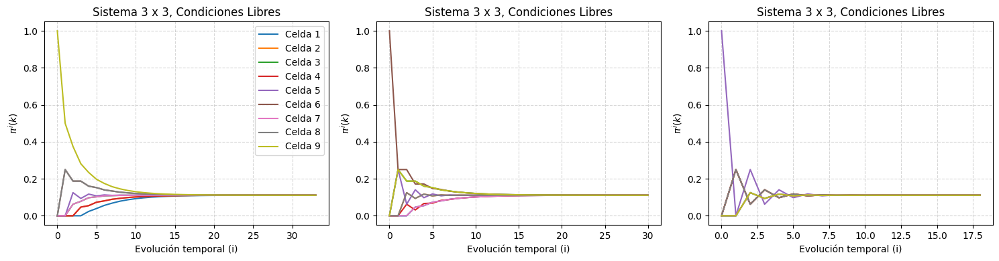

In [ ]:
print("Evolución temporal sistemas 3x3 con condiciones de frontera libres (fbc) para posiciones iniciales 9, 6, 5 respectivamente:\n")

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Graficar en cada subplot
system_3x3_fbc.plot_evolution(TE_i9_3x3_fbc, ax=axs[0])
system_3x3_fbc.plot_evolution(TE_i6_3x3_fbc, ax=axs[1],legend=False)
system_3x3_fbc.plot_evolution(TE_i5_3x3_fbc, ax=axs[2],legend=False)

plt.tight_layout()
plt.show()

Evolución temporal sistemas 3x3 con condiciones de frontera periódicas (pbc) para posiciones iniciales 9, 6, 5 respectivamente:



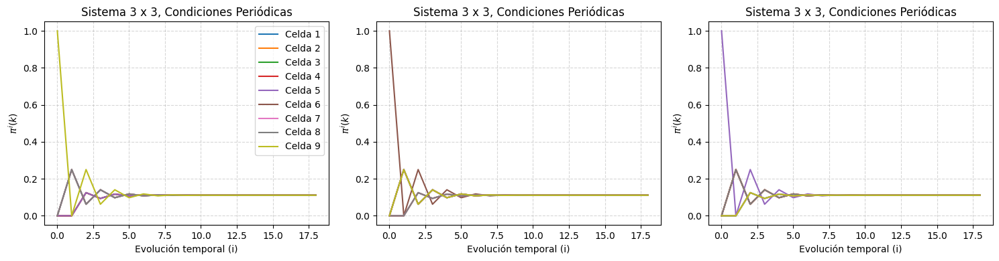

In [ ]:
print("Evolución temporal sistemas 3x3 con condiciones de frontera periódicas (pbc) para posiciones iniciales 9, 6, 5 respectivamente:\n")

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Graficar en cada subplot
system_3x3_pbc.plot_evolution(TE_i9_3x3_pbc, ax=axs[0])
system_3x3_pbc.plot_evolution(TE_i6_3x3_pbc, ax=axs[1],legend=False)
system_3x3_pbc.plot_evolution(TE_i5_3x3_pbc, ax=axs[2],legend=False)

plt.tight_layout()
plt.show()

Evolución temporal sistemas 4x4 con condiciones de frontera libres (fbc) para posiciones iniciales 16, 12, 10 respectivamente:



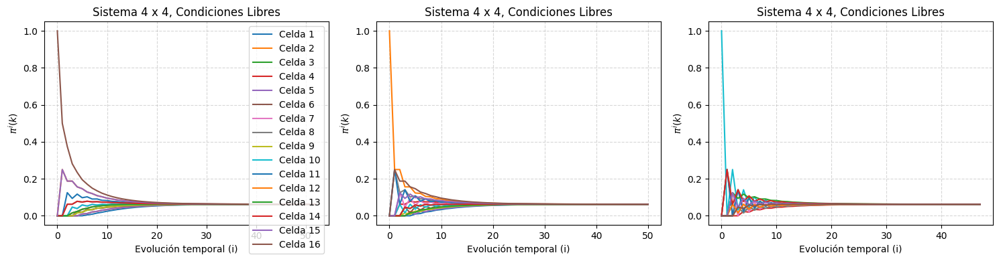

In [ ]:
print("Evolución temporal sistemas 4x4 con condiciones de frontera libres (fbc) para posiciones iniciales 16, 12, 10 respectivamente:\n")

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Graficar en cada subplot
system_4x4_fbc.plot_evolution(TE_i16_4x4_fbc, ax=axs[0])
system_4x4_fbc.plot_evolution(TE_i12_4x4_fbc, ax=axs[1],legend=False)
system_4x4_fbc.plot_evolution(TE_i10_4x4_fbc, ax=axs[2],legend=False)

plt.tight_layout()
plt.show()

Evolución temporal sistemas 4x4 con condiciones de frontera periódicas (pbc) para posiciones iniciales 16, 12, 10 respectivamente:



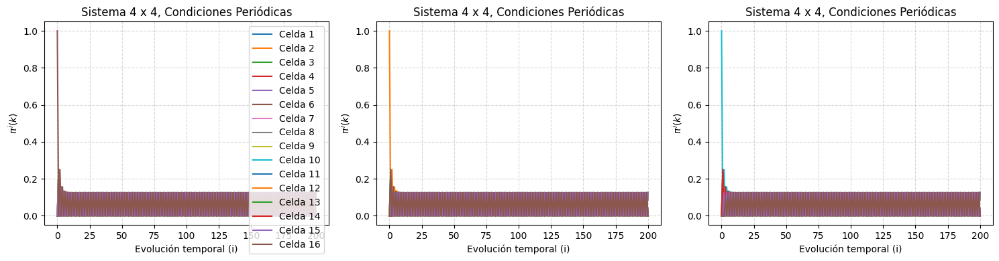

In [ ]:
print("Evolución temporal sistemas 4x4 con condiciones de frontera periódicas (pbc) para posiciones iniciales 16, 12, 10 respectivamente:\n")

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Graficar en cada subplot
system_4x4_pbc.plot_evolution(TE_i16_4x4_pbc, ax=axs[0])
system_4x4_pbc.plot_evolution(TE_i12_4x4_pbc, ax=axs[1],legend=False)
system_4x4_pbc.plot_evolution(TE_i10_4x4_pbc, ax=axs[2],legend=False)

plt.tight_layout()
plt.show()

Evolución temporal sistemas 5x5 con condiciones de frontera libres (fbc) para posiciones iniciales 25, 15, 13 respectivamente:



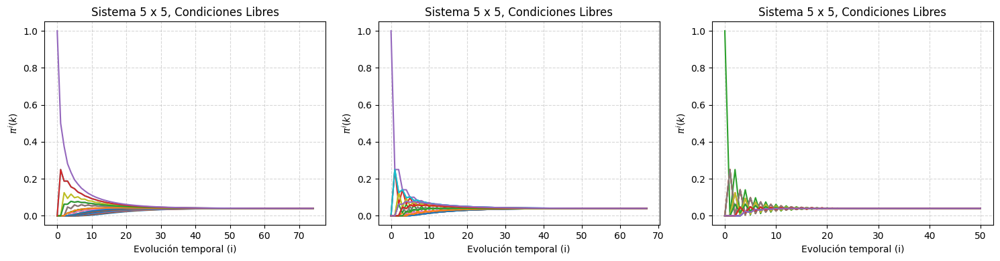

In [ ]:
print("Evolución temporal sistemas 5x5 con condiciones de frontera libres (fbc) para posiciones iniciales 25, 15, 13 respectivamente:\n")

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Graficar en cada subplot
system_5x5_fbc.plot_evolution(TE_i25_5x5_fbc, ax=axs[0],legend=False)
system_5x5_fbc.plot_evolution(TE_i15_5x5_fbc, ax=axs[1],legend=False)
system_5x5_fbc.plot_evolution(TE_i13_5x5_fbc, ax=axs[2],legend=False)

plt.tight_layout()
plt.show()

Evolución temporal sistemas 5x5 con condiciones de frontera periódicas (pbc) para posiciones iniciales 25, 15, 13 respectivamente:



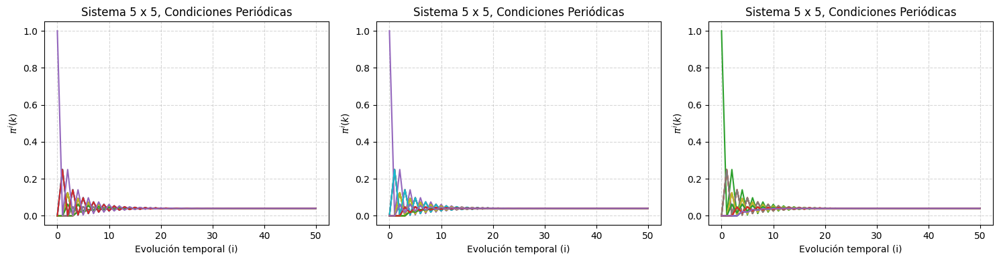

In [ ]:
print("Evolución temporal sistemas 5x5 con condiciones de frontera periódicas (pbc) para posiciones iniciales 25, 15, 13 respectivamente:\n")

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# Graficar en cada subplot
system_5x5_pbc.plot_evolution(TE_i25_5x5_pbc, ax=axs[0],legend=False)
system_5x5_pbc.plot_evolution(TE_i15_5x5_pbc, ax=axs[1],legend=False)
system_5x5_pbc.plot_evolution(TE_i13_5x5_pbc, ax=axs[2],legend=False)

plt.tight_layout()
plt.show()

## <font color='orange'>**Punto 4**</font>

<font color=lime>De acuerdo a sus resultados:
* Determine un criterio que permita distinguir entre el equilibrio y el no equilibrio.</font>

  Podemos definir un sistema en equilibrio cuando su distribución de probabilidad deja de cambiar significativamente en el tiempo.

  **Criterio**: Un sistema ha alcanzado el equilibrio si la diferencia máxima entre la distribución de probabilidad en dos pasos consecutivos es menor que un umbral dado el cual  tiende a cero (ε→0). Lo cual se puede expresar matemáticamente como:

  $$\max |\pi^{(i)}(k) - \pi^{(i-1)}(k)| < \epsilon $$

  Este mismo criterio fue implementado en la función `transition_evolution() `con el parámetro convergence, donde $ε = 1\times10^{-5}$.

  Por lo tanto, partiendo de esta definición para los sistemas estudiados podemos decir que:

  **Sistemas que alcanzaron el equilibrio:**
  3x3 fbc, 3x3 pbc, 4x4 fbc, 5x5 fbc, 5x5 pbc  

  **Sistemas que No alcanzaron el equilibrio:**
  4x4 pbc

  Para este último, como se ha discutido anteriormente el sistema se encuentra en un estado metaestable, es decir, en una oscilación continua entre dos distribuciones de probabilidad en cada iteración.

* <font color=lime>¿Qué se puede decir respecto al postulado de equiprobabilidad a priori en el equilibrio?</font>

  De los resultados se aprecia que sin importar el estado del que se parta, al evolucionar el sistema en el tiempo y dada las reglas de transición y condiciones de frontera, el sistema tiende de un estado definido a un sistema equiprobable en el equilibrio, considerando un caso particular en los sistemas de tamaño de matriz par y condiciones de frontera periodica en los cuales el estado es equiprobable para las casillas probables, es decir con probabilidad diferente de cero.


* <font color=lime>¿Qué se puede decir respecto a la ergodicidad del sistema?</font>

  Tal como se observa en los resultados, después de un número suficientemente grande de iteraciones el sistema alcanza una distribución de probabilidad equiprobable, independientemente del estado inicial. Esto indica que la probabilidad que inicialmente estaba concentrada en una sola casilla se distribuye uniformemente entre todas las posiciones a lo largo del tiempo.

  Este comportamiento sugiere que el sistema es ergódico, ya que la evolución temporal de una condición inicial específica tiende al mismo resultado que el promedio sobre todas las condiciones iniciales posibles. En otras palabras, el sistema visita todos los estados accesibles de manera equivalente, y por tanto, cumple con la condición de ergodicidad.


* <font color=lime>Haga un análisis de las diferencias entre ambos tipos de condiciones de frontera al momento de hacer la evolución dinámica de las probabilidades $\pi ^i(k)$.</font>

  Se aprecia que para las condiciones de frontera periódicas (pbc), no importa cual sea la posición inicial, se alcanza una convergencia dada, para un mismo número de iteraciones $i$ en el caso de tamaño impar de la matriz y una convergencia a un estado metaestable en el caso de matrices de tamaño par. Adicionalmente, se observa que cuando el sistema tiene las condiciones de frontera libres (fbc) se tarda menos en converger cuando parte de una posición centro, que cuando parte en la arista y su mayor tiempo de
  convergencia ocurre partiendo de una posición de esquina.

## <font color='orange'>**Punto 5**</font>

<font color=lime>Implemente adicionalmente en su algoritmo la entropía de Shannon $S$ con base en las probabilidades $\pi ^i(k)$ para obtener la evolución de dicha entropía con el número de iteraciones $i$ para $i$ suficientemente grande.</font>



El algoritmo fue implementado en la función `shannon_entropy()` dentro de la clase constructora, veamos ahora los resultados de esta en los diferentes sistemas:

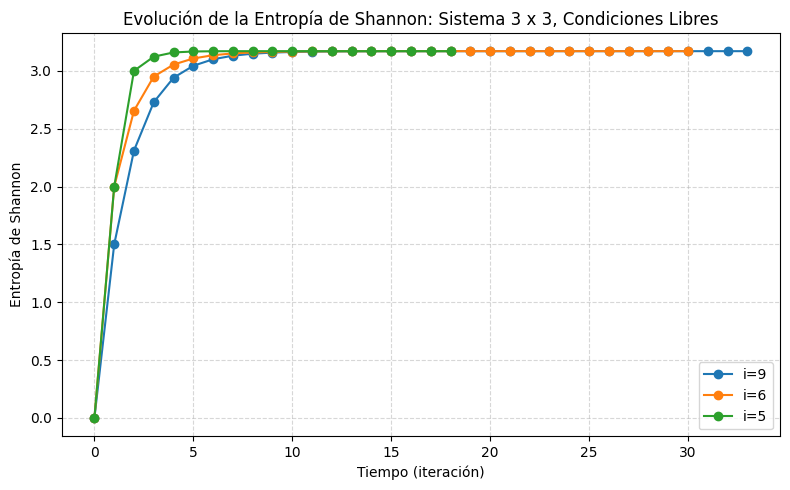

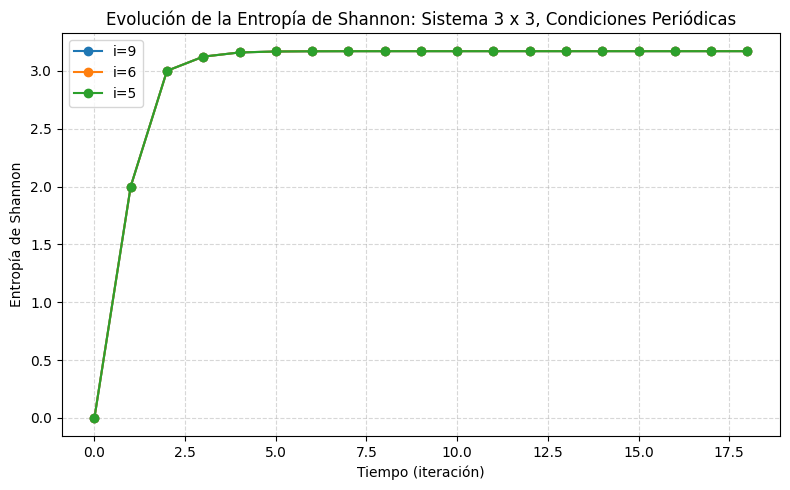

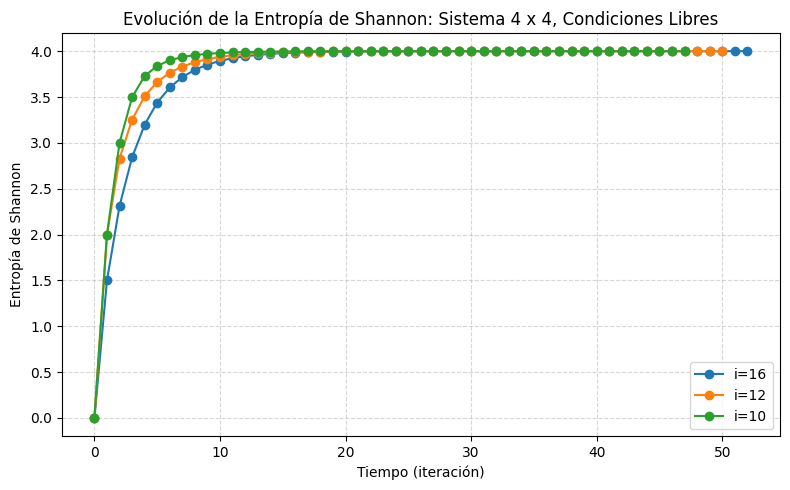

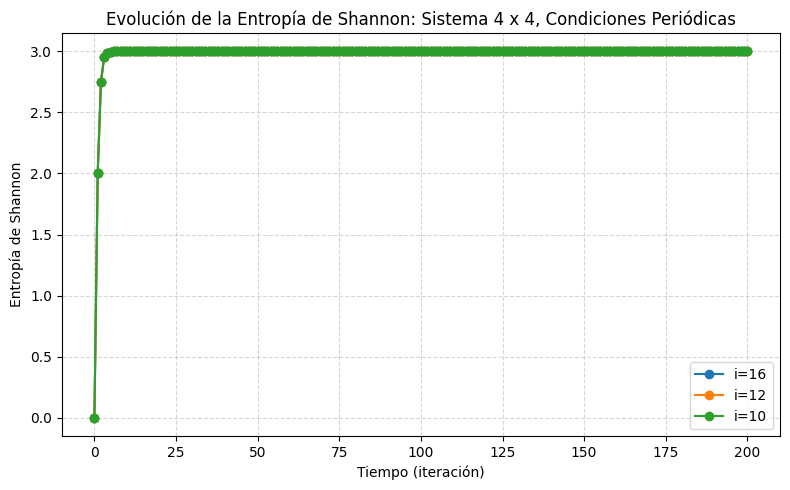

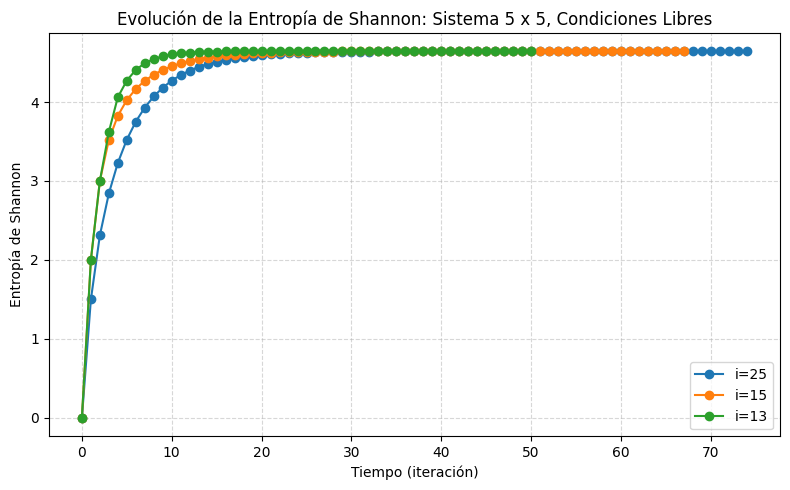

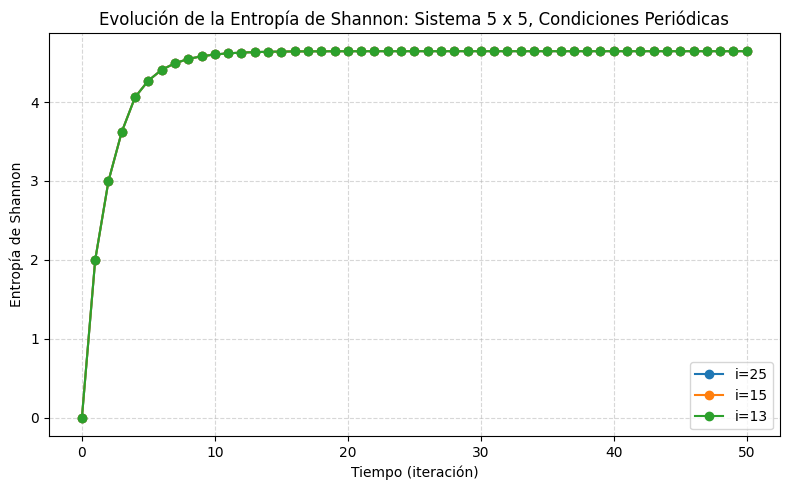

In [ ]:
S_3x3_fbc = system_3x3_fbc.shannon_entropy([TE_i9_3x3_fbc,TE_i6_3x3_fbc,TE_i5_3x3_fbc], labels=["i=9", "i=6" , "i=5"])
S_3x3_pbc = system_3x3_pbc.shannon_entropy([TE_i9_3x3_pbc,TE_i6_3x3_pbc,TE_i5_3x3_pbc], labels=["i=9", "i=6" , "i=5"])
S_4x4_fbc = system_4x4_fbc.shannon_entropy([TE_i16_4x4_fbc,TE_i12_4x4_fbc, TE_i10_4x4_fbc] , labels=["i=16", "i=12" , "i=10"])
S_4x4_pbc = system_4x4_pbc.shannon_entropy([TE_i16_4x4_pbc,TE_i12_4x4_pbc, TE_i10_4x4_pbc] , labels=["i=16", "i=12" , "i=10"])
S_5x5_fbc = system_5x5_fbc.shannon_entropy([TE_i25_5x5_fbc,TE_i15_5x5_fbc, TE_i13_5x5_fbc] , labels=["i=25", "i=15" , "i=13"])
S_5x5_pbc = system_5x5_pbc.shannon_entropy([TE_i25_5x5_pbc,TE_i15_5x5_pbc, TE_i13_5x5_pbc] , labels=["i=25", "i=15" , "i=13"])

Es de resaltar de las gráficas que el valor de la entropia máxima de Shannon para cada sistema esta alrededor del valor de tamaño de matriz considerado. Por ejemplo en el caso $3\times3$ esta al rededor de $3$ y en el caso $4\times4$ libre coincide exactamente con 4.

## <font color='orange'>**Punto 6**</font>

<font color=lime>Finalmente, utilice el método de Monte Carlo, usando números aleatorios para navegar a través del espacio de configuración, como alternativa de cálculo para el caso $3\times3$, partiendo de la esquina $k=9$, con fbc, y obtenga un histograma $n(k)$ del número de visitas por celda en función de $k$ que demuestre el postulado de equiprobabilidad a priori.</font>

A continuación se construye la clase correspondiente a la implementación de Monte Carlo sugerida:


In [ ]:
class MonteCarloSimulation:
    """
    Clase que realiza una simulación de Monte Carlo para un sistema con transiciones
    probabilísticas entre un conjunto discreto de estados.

    Atributos:
    - initial_position: estado inicial del sistema (índice entre 1 y N).
    - nbr: lista de estados posibles (por ejemplo, [1, 2, ..., N]).
    - transference_matrix: matriz NxN de probabilidades de transición entre estados.
    - N: número total de estados posibles.
    """

    def __init__(self, initial_position, nbr, transference_matrix):
        """
        Inicializa los parámetros de la simulación.

        Parámetros:
        - initial_position (int): estado inicial del sistema (1-indexado).
        - nbr (list of int): lista de estados posibles.
        - transference_matrix (2D array): matriz de transición (NxN) que define
                                          la probabilidad de pasar de un estado a otro.
        """
        self.initial_position = initial_position
        self.nbr = nbr
        self.transference_matrix = transference_matrix
        self.N = len(nbr)

    def run_simulation(self, Mcs):
        """
        Ejecuta la simulación de Monte Carlo.

        En cada paso:
        - Se escoge un estado destino al azar.
        - Se genera un número aleatorio r en [0,1).
        - Si r es menor que la probabilidad de transición desde el estado actual al destino,
          se acepta la transición y se actualiza el estado actual.

        Parámetros:
        - Mcs (int): número de pasos (iteraciones) de la simulación.

        Retorna:
        - count (ndarray): vector de tamaño N con el número de veces que el sistema visitó
                           cada estado durante la simulación.
        """
        actual_position = self.initial_position
        count = np.zeros(self.N)
        count[actual_position - 1] += 1  # Ajuste por índice 0 en Python

        for i in range(1, Mcs + 1):
            random_position = random.randint(1, self.N)  # Candidato aleatorio
            r = random.random()  # Número aleatorio para aceptar/rechazar transición
            if r <= self.transference_matrix[actual_position - 1][random_position - 1]:
                actual_position = random_position
            count[actual_position - 1] += 1

        return count

    def plot_histograms(self, Mcs_values):
        """
        Grafica histogramas de la frecuencia de visita a cada estado para diferentes
        cantidades de pasos de Monte Carlo.

        Parámetros:
        - Mcs_values (list of int): lista de diferentes valores de pasos Monte Carlo (Mcs)
                                    para los cuales se desea ejecutar y graficar la simulación.
        """
        configurations = np.arange(1, self.N + 1)
        plt.figure(figsize=(8, 3 * len(Mcs_values)))  # Se ajusta el tamaño de la figura según # de subplots

        for idx, Mcs in enumerate(Mcs_values, start=1):
            plt.subplot(len(Mcs_values), 1, idx)  # Crea subgráficos verticales
            result = self.run_simulation(Mcs)
            plt.bar(configurations, result, alpha=0.7)
            plt.title(f'{Mcs} Iteraciones')
            plt.ylabel('# de veces en cada configuración')
            plt.xticks(configurations)

        plt.tight_layout()
        plt.xlabel('Configuración del sistema')
        plt.ylabel('# de veces en cada configuración')
        plt.show()

In [ ]:
Mc_simulation_3x3_fbc = MonteCarloSimulation(initial_position = 9, nbr = system_3x3_fbc.nbrs , transference_matrix = system_3x3_fbc.transference_matrix)
Mc_simulation_4x4_fbc = MonteCarloSimulation(initial_position = 16, nbr = system_4x4_fbc.nbrs , transference_matrix = system_4x4_fbc.transference_matrix)
Mc_simulation_5x5_fbc = MonteCarloSimulation(initial_position = 25, nbr = system_5x5_fbc.nbrs , transference_matrix = system_5x5_fbc.transference_matrix)

Histograma para el sistema 3x3 con condiciones de frontera libres (fbc), posición inicial: 9:


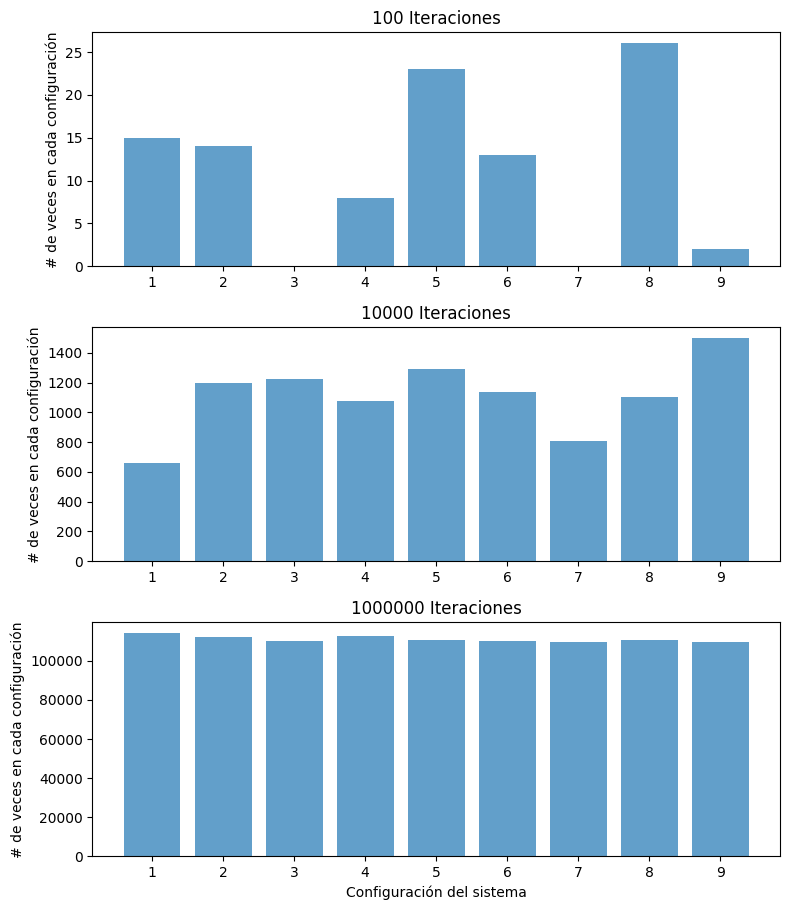

In [ ]:
Mcs_values = [100, 10000, 1000000]
print("Histograma para el sistema 3x3 con condiciones de frontera libres (fbc), posición inicial: 9:")
Mc_simulation_3x3_fbc.plot_histograms(Mcs_values)

Histograma para el sistema 4x4 con condiciones de frontera libres (fbc), posición inicial: 16:


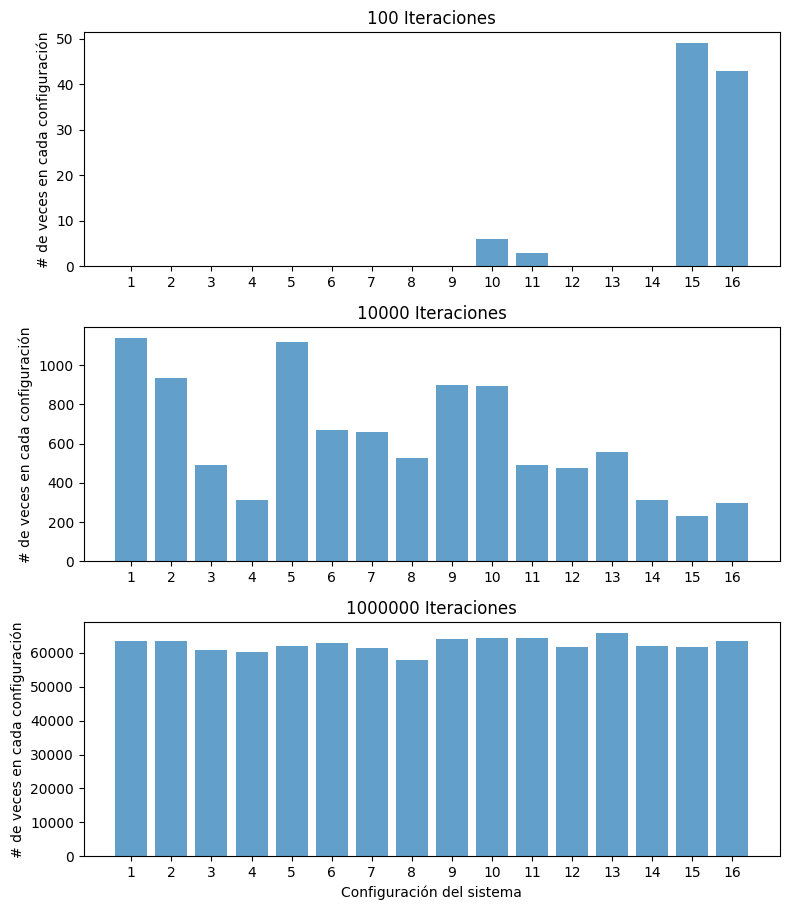

In [ ]:
print("Histograma para el sistema 4x4 con condiciones de frontera libres (fbc), posición inicial: 16:")
Mc_simulation_4x4_fbc.plot_histograms(Mcs_values)

Histograma para el sistema 5x5 con condiciones de frontera libres (fbc), posición inicial: 25:


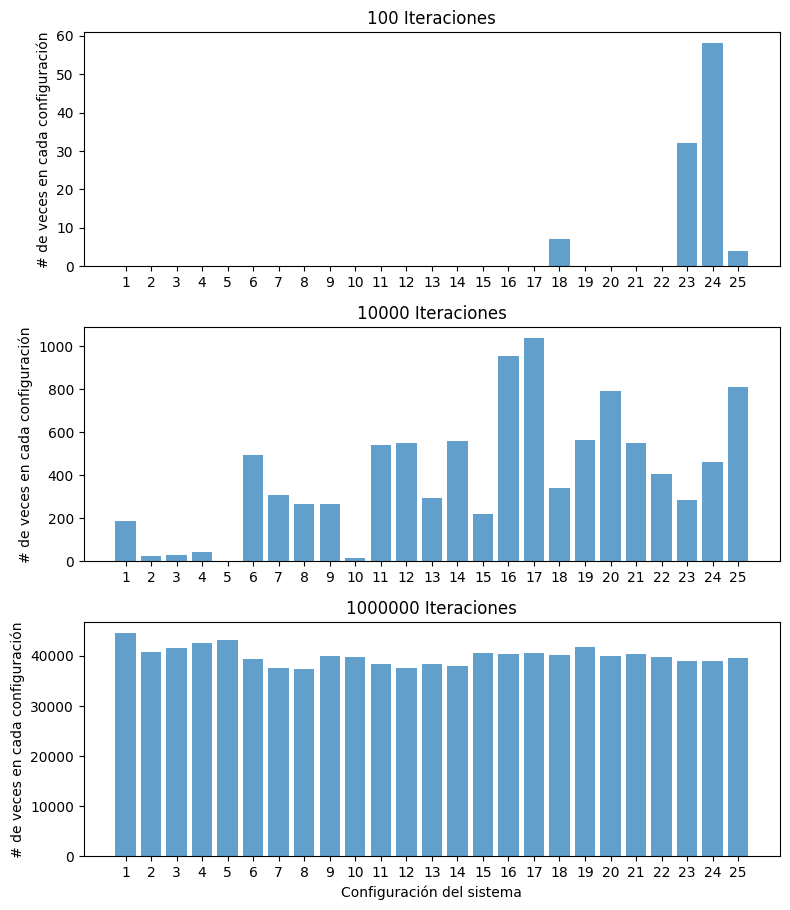

In [ ]:
print("Histograma para el sistema 5x5 con condiciones de frontera libres (fbc), posición inicial: 25:")
Mc_simulation_5x5_fbc.plot_histograms(Mcs_values)

A partir de la evolución de los histogramas observados en los diferentes sistemas estudiados queda en evidencia la tendencia de estos a una distribución de probabilidad equiprobable ya que a medida que se aumenta el número de iteraciones la distribución observada tiende a una distribución uniforme o equiprobable, confirmando así el principio de equiprobabilidad a priori.

## <font color='orange'>**Punto 7**</font>

<font color=lime>Investigar y hacer la derivación analítica de la "ecuación maestra".</font>


Para esta derivación partamos de la ecuación (3) vista en clase:

$$
\pi_{t+1}(i)= \sum_{j=1}^{N} \pi_t(j)p(j→i)
$$

Teniendo en cuenta la definición de derivada, se puede proponer la siguiente aproximación en el caso discreto:

$$
\dot{\pi_i}=\frac{d\pi_i}{dt}= \frac{\pi^{t+1}_i-\pi^t_i}{t+1-t}
$$

$$
= \sum_{j=1}^{N} \pi(j)p(j→i) - \pi(i)
$$

Ahora, considerando nuevamente la ecuación (3), se puede remplazar $\pi(i)= \sum_{j=1}^{N} \pi(j)p(j→i)$, por lo cual:

$$
= \sum_{j=1}^{N} \pi(j)p(j→i) - \sum_{j=1}^{N} \pi(j)p(j→i)
$$

Pero dada la simetria de la matriz de transición, en clase se discutio que:

$$
\sum_{j=1}^{N} \pi(j)p(j→i)= \sum_{j=1}^{N} \pi(i)p(i→j)
$$

De lo cual se puede llegar finalmente a que:

$$
\dot{\pi_i}= \sum_{j=1}^{N} (\pi(i)p(i→j) -  \pi(j)p(j→i))
$$

$$
\dot{\pi_i}= \sum_{j=1}^{N} (\pi(i)W_{ij} -  \pi(j)W_{ji})
$$